#  <font color='#57998f'>Taxi Trajectory Data | Data Preprocessing </font>

Current notebook is part of the final assignment in the context of **'Machine Learning'** course, <br> provided by MSc in Artificial Intelligence from NCSR Demokritos. 

Dataset Reference:  
Taxi Service Trajectory - Prediction Challenge, [ECML PKDD](https://ecmlpkdd.org/) 2015 Data Set <br>

  
<br>

> Chiotis Nikolaos - MTN2221 <br>
> chiotisn@yahoo.com <br>





##  <font color='#37665f'>Dataset Description</font> 

Dataset contains information of the **trajectories** for **442 taxis** running in the city of Porto, in Portugal.  
The available data cover the time period of a year, from **July 2013 - June 2014**.

These taxis operated using mobile data terminals installed in the vehicles.

The data collected, have the below features:

|  | Feature Name | DataType | Description |
| :-: | :-: | :-: | :- |
| 1 | **TRIP_ID** | String | Contains an unique **id** for each trip |
| 2 | **CALL_TYPE** | String | Identifies the way used to **demand this service**. <br><br> It may contain one of three possible values: <br> **A**: if this trip was dispatched from the central <br> **B**: if this trip was demanded directly to a taxi driver on a specific stand <br> **C**: otherwise (i.e. a trip demanded on a random street) |
| 3 | **ORIGIN_CALL** | Integer | Contains a **customer id** for each phone number which was used to demand, at least, one service. <br> It identifies the trip’s customer if CALL_TYPE=’A’, otherwise, it assumes a NULL value |
| 4 | **ORIGIN_STAND** | Integer |  Contains a **taxi stand id**. <br> It identifies the starting point of the trip if CALL_TYPE=’B’, otherwise, it assumes a NULL value |
| 5 | **TAXI_ID** | Integer | Contains the **taxi driver's id** that performed each trip |
| 6 | **TIMESTAMP** | Integer | **Trip's start** in Unix Timestamp (seconds) |
| 7 | **DAYTYPE** | String | Identifies the **daytype of the trip’s start**. <br> It assumes one of three possible values: <br> **B**: if this trip started on a holiday or any other special day (i.e. extending holidays, floating holidays, etc.) <br> **C**: if the trip started on a day before a type-B day <br> **A**: otherwise (i.e. a normal day, workday or weekend)|
| 8 | **MISSING_DATA** | Boolean | TRUE whenever **one (or more) locations are missing**, FALSE when the GPS data stream is complete |
| 9 | **POLYLINE** | String | It contains a **list of GPS coordinates** (i.e. WGS84 format) mapped as a string. <br>  Each pair of coordinates is by brackets as [LONGITUDE, LATITUDE]. <br> This list contains **one pair of coordinates for each 15 seconds** of trip. <br> The last list item corresponds to the trip’s destination while the first one represents its start |



<br> <br>

##  <font color='#37665f'>Requirements</font> 

This project developed and executed using **Python 3.9.6.**  in **Jupyter Notebook**.<br><br>
Dataset size: **1.9GB** <br><br>
**Libraries** used, can be found at [requirements.txt](https://github.com/chiotisn/MScAI-ML-Assignment-ChiotisN/blob/main/requirements.txt).

In [530]:
import os
import wget
import shutil

import re
import pandas as pd

import shapely
from shapely.geometry import Point

os.environ['USE_PYGEOS'] = '0'
import geopandas as gpd

import folium
from folium import plugins

import seaborn as sns
import matplotlib.pyplot as plt

import scipy
import osmnx as ox
import networkx as nx

pd.set_option('display.max_columns', 500)
pd.set_option('display.max_rows', 500)

<br> <br>

##  <font color='#37665f'>Load & Read Dataset</font> 

#### <font color='#425451'>Download dataset</font> 
<font color='#425451'>Checks if dataset is loaded, if not, the **zip** file that contains the dataset is downloaded using **wget** and unzipped.</font> 

In [1018]:
print('Looking for dataset\'s zip..')

# Check if zip file that contains the dataset exists in folder, if not, download it
if os.path.exists('./archive.zip'):
    print('Dataset\'s zip file already in folder:\tarchive.zip')
else: 
    print('Downloading dataset\'s zip file..')
    wget.download(r'https://archive.ics.uci.edu/ml/machine-learning-databases/00339/train.csv.zip', out='./archive.zip')
    print('\nDataset\'s zip file downloaded in:\tarchive.zip')
    
# Check if csv file that is contained in zip exists in folder, if not, unzip the zip file
if os.path.exists('./train.csv'):
    print('Dataset\'s zip file already unzipped:\ttrain.csv \nWe are ready to go!')
else: 
    print('Unziping dataset\'s zip file..')
    shutil.unpack_archive('./archive.zip')
    print('Dataset\'s zip file unzipped in:\t\ttrain.csv')

Looking for dataset's zip..
Dataset's zip file already in folder:	archive.zip
Dataset's zip file already unzipped:	train.csv 
We are ready to go!


#### <font color='#425451'>Read in Pandas DataFrame.</font> 

In [1031]:
converters_dict =  {'TRIP_ID': lambda x: str(x),
                    'ORIGIN_CALL': lambda x: str(x),
                    'ORIGIN_STAND': lambda x: str(x),
                    'TAXI_ID': lambda x: str(x)}

df = pd.read_csv('./train.csv', converters=converters_dict)

<font color='#425451'>Dataset shape</font> 

In [1032]:
print('Dataset has {} columns and {} rows.'.format(df.shape[1],df.shape[0]))

Dataset has 9 columns and 1710670 rows.


<br> <br>

##  <font color='#37665f'>Data Preprocessing</font> 

####  <font color='#425451'>Undersample Data</font> 

In order to make calculations faster, especially on geospacial processing, we are going to undersample the dataset in 100K records. 

In [1033]:
df = df.sample(100000, random_state=10).reset_index(drop=True)

####  <font color='#425451'>Parse Polyline</font> 

Taxis' Trajectories are stores in String datatype, to use them properly they need to be transformed. <br>
They will be transformed in two columns:  

**DATA_POINTS**: A list of tuples that represent the coordinates of the trajectory <br>
**POLYLINE**: A string representation of a Polyline, so it can be later loaded in geopandas

<font color='#425451'>Check data string pattern</font> 

In [1034]:
df.loc[0,'POLYLINE']

'[[-8.628282,41.157828],[-8.628228,41.157837],[-8.628021,41.157783],[-8.628201,41.158701],[-8.629857,41.158773],[-8.63091,41.158251],[-8.633556,41.15871],[-8.635518,41.159016],[-8.635536,41.158989],[-8.635905,41.159043],[-8.638371,41.159457],[-8.640531,41.159844],[-8.642601,41.160177],[-8.643699,41.160411],[-8.643699,41.160474],[-8.644347,41.159583],[-8.645481,41.157945],[-8.646183,41.156217],[-8.647857,41.15493],[-8.649054,41.154543],[-8.649279,41.154363],[-8.650485,41.153841],[-8.651763,41.152527],[-8.654301,41.152221],[-8.655804,41.151825],[-8.655723,41.151681],[-8.655678,41.15169],[-8.655327,41.151618],[-8.655237,41.151519],[-8.655138,41.15142],[-8.655093,41.151384],[-8.655138,41.151447],[-8.655156,41.151483],[-8.655129,41.151483],[-8.655093,41.151465],[-8.655102,41.151447]]'

<font color='#425451'>Apply regex that captures coordinates & transform them in float </font> 

In [1035]:
# regex captures two groups of data
# first is between '[' and ',' character and represents Longitude
# second between ',' and ']' charachter and represents Latitude
df.loc[:,'DATA_POINTS'] = df.loc[:,'POLYLINE'].apply(lambda x: re.findall('\[([^\[\]]+)\,([^\[\]]+)\]', x))

# transform regex string outputs in float
df.loc[:,'DATA_POINTS'] = df.loc[:,'DATA_POINTS'].apply(lambda x: [(float(i[0]),float(i[1])) for i in x])

# uncomment check results
# print(df.loc[0,'DATA_POINTS'])

In [1036]:
# transform regex string outputs in float
df.loc[:,'DATA_POINTS'] = df.loc[:,'DATA_POINTS'].apply(lambda x: [(float(i[0]),float(i[1])) for i in x])

<font color='#425451'>Transform in Polyline format </font> 

In [1037]:
df.loc[:,'POLYLINE'] = df.loc[:,'POLYLINE'].str[1:-1] \
                                           .str.replace(',', ' ') \
                                           .str.replace(r'\] \[', ',', regex=True) \
                                           .str.replace(r'\[', 'LINESTRING (', regex=True) \
                                           .str.replace(r'\]', ')', regex=True)

<font color='#425451'>Check Results </font> 

In [1038]:
print(df.loc[0,'DATA_POINTS'])

[(-8.628282, 41.157828), (-8.628228, 41.157837), (-8.628021, 41.157783), (-8.628201, 41.158701), (-8.629857, 41.158773), (-8.63091, 41.158251), (-8.633556, 41.15871), (-8.635518, 41.159016), (-8.635536, 41.158989), (-8.635905, 41.159043), (-8.638371, 41.159457), (-8.640531, 41.159844), (-8.642601, 41.160177), (-8.643699, 41.160411), (-8.643699, 41.160474), (-8.644347, 41.159583), (-8.645481, 41.157945), (-8.646183, 41.156217), (-8.647857, 41.15493), (-8.649054, 41.154543), (-8.649279, 41.154363), (-8.650485, 41.153841), (-8.651763, 41.152527), (-8.654301, 41.152221), (-8.655804, 41.151825), (-8.655723, 41.151681), (-8.655678, 41.15169), (-8.655327, 41.151618), (-8.655237, 41.151519), (-8.655138, 41.15142), (-8.655093, 41.151384), (-8.655138, 41.151447), (-8.655156, 41.151483), (-8.655129, 41.151483), (-8.655093, 41.151465), (-8.655102, 41.151447)]


In [1039]:
print(df.loc[0,'POLYLINE'])

LINESTRING (-8.628282 41.157828,-8.628228 41.157837,-8.628021 41.157783,-8.628201 41.158701,-8.629857 41.158773,-8.63091 41.158251,-8.633556 41.15871,-8.635518 41.159016,-8.635536 41.158989,-8.635905 41.159043,-8.638371 41.159457,-8.640531 41.159844,-8.642601 41.160177,-8.643699 41.160411,-8.643699 41.160474,-8.644347 41.159583,-8.645481 41.157945,-8.646183 41.156217,-8.647857 41.15493,-8.649054 41.154543,-8.649279 41.154363,-8.650485 41.153841,-8.651763 41.152527,-8.654301 41.152221,-8.655804 41.151825,-8.655723 41.151681,-8.655678 41.15169,-8.655327 41.151618,-8.655237 41.151519,-8.655138 41.15142,-8.655093 41.151384,-8.655138 41.151447,-8.655156 41.151483,-8.655129 41.151483,-8.655093 41.151465,-8.655102 41.151447)


####  <font color='#425451'>Extract trajectory length</font> 

In [1040]:
df['LENGTH'] = df.loc[:,'DATA_POINTS'].apply(len)

<font color='#425451'>Drop records that only have no or one point in trajectory </font> 

In [1041]:
indices_to_drop = df[df['LENGTH']<=1].index
df.drop(indices_to_drop, axis=0, inplace=True)
print('{} records dropped, due to trajectory length.'.format(len(indices_to_drop)))

2084 records dropped, due to trajectory length.


####  <font color='#425451'>Extract starting & ending point of each trip</font> 

In [1042]:
df['FROM_LOCATION'] = df.loc[:,'DATA_POINTS'].str[0]
df['TO_LOCATION'] = df.loc[:,'DATA_POINTS'].str[-1]

####  <font color='#425451'>Drop records that have missing trajectory data</font> 

In [1043]:
indices_to_drop = df[df['MISSING_DATA']==True].index
df.drop(indices_to_drop, axis=0, inplace=True)
print('{} records dropped, due to missing trajectory data.'.format(len(indices_to_drop)))

1 records dropped, due to missing trajectory data.


In [1044]:
# column MISSING_DATA no longer required
df.drop(columns=['MISSING_DATA'], inplace=True)

####  <font color='#425451'>Extract travel duration</font> 
Trajectories contain tha starting point and one pair of coordinates for each 15 seconds.  
So, in order to find the travel time we multiply the number of coordinates, excluding the starting point, with 15 seconds.

In [1045]:
df['TRAVEL_DURATION'] = 15*(df.loc[:,'LENGTH'] - 1)

####  <font color='#425451'>Calculate departure & arrival time</font> 

In [1046]:
df['FROM_DATE'] = pd.to_datetime(df.loc[:,'TIMESTAMP'], unit='s')
df['TO_DATE'] = pd.to_datetime(df.loc[:,'TIMESTAMP'] + df.loc[:,'TRAVEL_DURATION'], unit='s')

In [1047]:
# column TIMESTAMP no longer required
df.drop(columns=['TIMESTAMP'], inplace=True)

####  <font color='#425451'>Extract date info</font> 

In [1048]:
df['HOUR'] = df.loc[:,'FROM_DATE'].dt.hour
df['DAY_OF_WEEK'] = df.loc[:,'FROM_DATE'].dt.weekday
df['MONTH'] = df.loc[:,'FROM_DATE'].dt.month

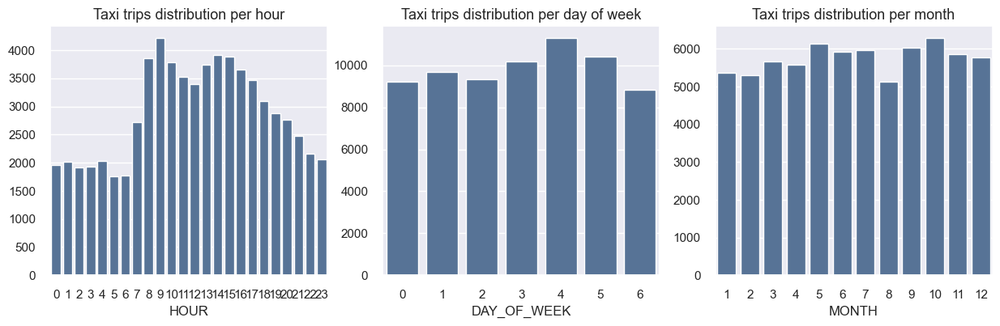

In [1325]:
sns.set_theme()
fig, (ax1, ax2, ax3) = plt.subplots(1, 3)
fig.set_size_inches(15, 4)

tmp = df.groupby('HOUR').size().to_frame().reset_index()
_ = sns.barplot(x=tmp['HOUR'], y=tmp[0], ax=ax1, color='#4c72a1')
tmp = df.groupby('DAY_OF_WEEK').size().to_frame().reset_index()
_ = sns.barplot(x=tmp['DAY_OF_WEEK'], y=tmp[0], ax=ax2, color='#4c72a1')
tmp = df.groupby('MONTH').size().to_frame().reset_index()
_ = sns.barplot(x=tmp['MONTH'], y=tmp[0], ax=ax3, color='#4c72a1')

ax1.set_title('Taxi trips distribution per hour', fontsize=13)
ax2.set_title('Taxi trips distribution per day of week', fontsize=13)
ax3.set_title('Taxi trips distribution per month', fontsize=13)

ax1.set_ylabel('')
ax2.set_ylabel('')
ax3.set_ylabel('')

plt.show()

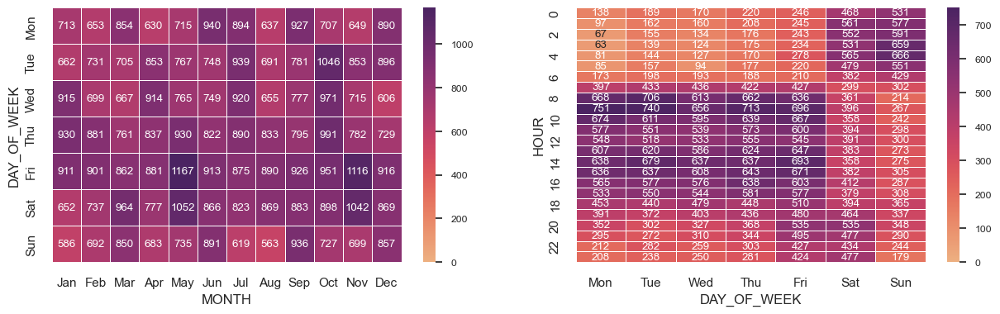

In [1301]:
sns.set_theme()
fig, (ax1, ax2) = plt.subplots(1, 2)
fig.set_size_inches(15, 4)
sns.set(font_scale=0.8)

tmp = df[['DAY_OF_WEEK','MONTH']].groupby(['DAY_OF_WEEK','MONTH']).size().reset_index().pivot(index='DAY_OF_WEEK',columns='MONTH',values=0)
h1 = sns.heatmap(tmp, annot=True, fmt='d', linewidths=.5, vmin=0, cmap='flare', ax=ax1,
                 yticklabels=['Mon','Tue','Wed','Thu','Fri','Sat','Sun'],
                 xticklabels=['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec'])

tmp = df[['DAY_OF_WEEK','HOUR']].groupby(['HOUR','DAY_OF_WEEK']).size().reset_index().pivot(index='HOUR',columns='DAY_OF_WEEK',values=0)
h2 = sns.heatmap(tmp, annot=True, fmt='d', linewidths=.5, vmin=0, cmap='flare', ax=ax2,
                 xticklabels=['Mon','Tue','Wed','Thu','Fri','Sat','Sun'])

<br> <br>

##  <font color='#37665f'>Geospatial Preprocessing</font> 

In order to enhance our dataset, we are going to incorporate more layers of geospatial information in the dataset. <br>
These datasets include: <br> 

- <ins>Portugal Road Network</ins><br>
Author: Open Street Map <br>   <br>   

- <ins>Portugal administrative Boundaries</ins><br>
Author: Direção-Geral do Território <br>
Licence: Public domain <br>
Data available [here](https://cityloops.metabolismofcities.org/library/812323/) <br><br>

####  <font color='#425451'>Transform in GeoDataFrame</font> 

In [1049]:
df = gpd.GeoDataFrame(df.drop('POLYLINE', axis=1), geometry=gpd.GeoSeries.from_wkt(df['POLYLINE']))
df = df.set_crs('EPSG:4326').to_crs('EPSG:5018')

In [1050]:
df['FROM_LOCATION'] = gpd.GeoSeries.from_xy(df['FROM_LOCATION'].str[0], df['FROM_LOCATION'].str[1], crs='EPSG:4326').to_crs('EPSG:5018')
df['TO_LOCATION'] = gpd.GeoSeries.from_xy(df['TO_LOCATION'].str[0], df['TO_LOCATION'].str[1], crs='EPSG:4326').to_crs('EPSG:5018')

<font color='#425451'>Plot starting points heatmap </font> 

In [1053]:
folium_map = folium.Map(location=[41.157684, -8.615602],zoom_start=13)
c = sns.color_palette('ch:start=.2,rot=-.3').as_hex()
plugins.HeatMap([[i.y,i.x] for i in df['FROM_LOCATION'].to_crs('EPSG:4326')[:10000]],
                gradient={0.1: c[0], .35: c[1], .65: c[2], .9: c[3], .95: c[4], 1: c[5]}, 
                radius = 20).add_to(folium_map)

folium_map.save('./visualization/starting_heatmap.html')
folium_map

In [1054]:
folium_map = folium.Map(location=[41.157684, -8.615602],zoom_start=13)

for i in df['FROM_LOCATION'].to_crs('EPSG:4326')[:20000]:
    folium.Circle(location = [i.y, i.x], radius=50,color='#4c72a1',weight=0.8,fill_color='#4c72a1',fill_opacity=0.2,fill=True).add_to(folium_map)

folium_map.save('./visualization/starting_points.html')
folium_map

<font color='#425451'>Plot routes </font> 

In [1055]:
folium_map = folium.Map(location=[41.157684, -8.615602],zoom_start=13)
routes = gpd.GeoSeries(df['geometry'].to_crs('EPSG:4326')[:1000]).simplify(tolerance=0.001)
routes = routes.to_json()
routes = folium.GeoJson(data=routes, style_function=lambda x: {'weight': 3, 'color':'#4c72a1', 'opacity':0.5})
routes.add_to(folium_map)
folium_map.save('./visualization/routes_sample.html')
folium_map

####  <font color='#425451'>Calculate length of trip based on trajectories (in meters)</font> 

In [1056]:
df['TRAJ_LINE_LENGTH'] = df['geometry'].length

#### <font color='#425451'>Extract information from trajectories</font> 

<font color='#425451'>Prepare dataset </font> 

For each trajectory, we explode the coordinates of the trip in seperate rows, <br>
Then, we shift the rows, so we can get the coordinates of the previous transmission 
and we erase the rows that contain only the starting point for each trip. <br>
Finally, we convert information in GeoDataFrame.


In [1057]:
def get_exploded_trajectories(gdf):
    
    # explode each line's point in different rows
    exploded_traj = gdf.set_index('TRIP_ID')['geometry'] \
                      .apply(lambda line: [coords for coords in line.coords]) \
                      .explode() \
                      .reset_index() \
                      .rename(columns={'geometry':'POINT'})

    # shift rows to get the information for the previous point
    exploded_traj['PREVIOUS_POINT'] = exploded_traj.groupby('TRIP_ID', group_keys=False)['POINT'].apply(lambda x: x.shift(1))

    # due to the shift, the first point of each trajectory, has no info of the PREVIOUS_POINT, so we discard the first POINTS
    exploded_traj = exploded_traj[exploded_traj['PREVIOUS_POINT'].notna()]

    # convert to GeoDataFrame
    exploded_traj = gpd.GeoDataFrame(exploded_traj)

    exploded_traj['POINT'] = gpd.GeoSeries.from_xy(exploded_traj['POINT'].str[0], 
                                                   exploded_traj['POINT'].str[1],
                                                   crs='EPSG:5018')

    exploded_traj['PREVIOUS_POINT'] = gpd.GeoSeries.from_xy(exploded_traj['PREVIOUS_POINT'].str[0], 
                                                            exploded_traj['PREVIOUS_POINT'].str[1],
                                                            crs='EPSG:5018')
    
    return exploded_traj    

In [1058]:
exploded_traj = get_exploded_trajectories(df)

<font color='#425451'>Calculate distance for each pair of points (in meters)</font> 

In [1059]:
exploded_traj['DISTANCE'] = exploded_traj['POINT'].distance(exploded_traj['PREVIOUS_POINT'])

<AxesSubplot: >

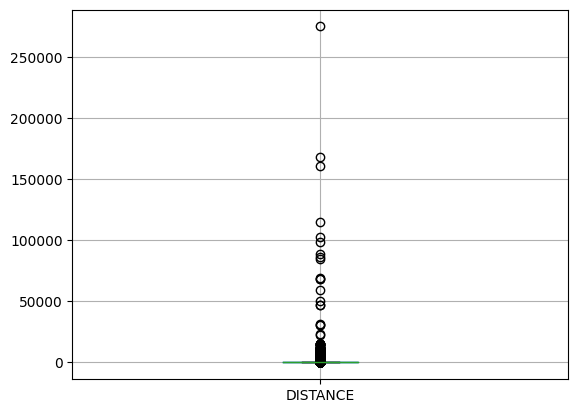

In [1060]:
exploded_traj[['TRIP_ID','DISTANCE']].boxplot()

In [1061]:
exploded_traj[['TRIP_ID','DISTANCE']].describe()

,DISTANCE
count,4.774347e+06
mean,1.156882e+02
std,2.501017e+02
min,0.000000e+00
25%,1.542393e+01
50%,8.801228e+01
75%,1.679289e+02
max,2.750398e+05


### <font color='#425451'>Outliers Detection & Cleanup</font> 

It seems that some pairs of coordinates are too far for each other. <br>
Based on the real world, no vehicle can cover a distance of 5851m in 15sec.<br>
First, we are going to keep trips that are within city of Porto. <br> 
Then, we are going to check the calculated speed, in order to identify outliers. 

#### <font color='#425451'>Exclude trips outside Porto</font> 

<font color='#425451'>Read Porto Administrative Geometry </font> 

In [1062]:
bnd = gpd.read_file(r'./geodata/City Boundaries of Portugal.zip').to_crs('EPSG:5018')
porto_boundaries = bnd[bnd['Concelho']=='PORTO']

<font color='#425451'>Keep only trips that are within Porto</font> 

In [1063]:
indices_to_drop = df[~df.within(porto_boundaries.iloc[0,-1])].index
df.drop(indices_to_drop, axis=0, inplace=True)
print('{} records dropped, because were not within Porto.'.format(len(indices_to_drop)))

28213 records dropped, because were not within Porto.


#### <font color='#425451'>Exclude outlier trajectory data</font> 

In [1064]:
exploded_traj = get_exploded_trajectories(df)
exploded_traj['DISTANCE'] = exploded_traj['POINT'].distance(exploded_traj['PREVIOUS_POINT'])

<font color='#425451'>Calculate speed between each pair of points (in km/h) </font> 

In [1065]:
# distance D corresponds to a 15sec trip, to calculate speed we:
# multiply by 4 to calculate meters per minute, 
# multiply by 60 to calculate meters per hour, 
# divide by 1000 to get km per hour
exploded_traj['SPEED'] = exploded_traj['DISTANCE']*4*60/1000

<font color='#425451'>We use boxplot metrics, in order to calculate the upper bound for the outliers.  </font> 

In [1066]:
q1 = exploded_traj['SPEED'].quantile(0.25)
q3 = exploded_traj['SPEED'].quantile(0.75)
iqr = q3 - q1
speed_upper_bound = q3 + 1.5*iqr
print('Based on boxplot metrics, {:.2f} is the upper bound of speed that should consider normal.'.format(speed_upper_bound))

Based on boxplot metrics, 79.52 is the upper bound of speed that should consider normal.


<font color='#425451'>Calculate speed delta between each pair of points </font> <br><br>
The speed upper bound seems to low, to mark a speed as outlier. <br>
For example, in highways a taxi can reach such speed <br>
These measurements, probably caused by inaccurate coordinates in some trajectories. <br>
In order to make the outliers detection more accurate, we are going to calculate speed delta, <br>
to compare how the speed has increased comparing to the previous interval. <br>

In [1067]:
exploded_traj['PREVIOUS_SPEED'] = exploded_traj.groupby('TRIP_ID', group_keys=False)['SPEED'].apply(lambda x: x.shift(1))
exploded_traj['SPEED_DELTA'] = (exploded_traj['SPEED'] - exploded_traj['PREVIOUS_SPEED']).abs().fillna(0)

<AxesSubplot: >

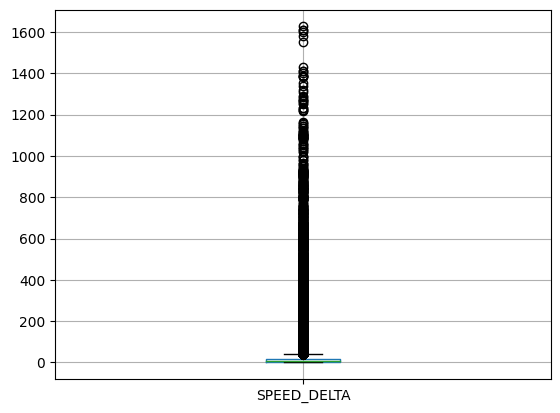

In [1068]:
exploded_traj[['TRIP_ID','SPEED_DELTA']].boxplot()

In [1069]:
q1 = exploded_traj['SPEED_DELTA'].quantile(0.25)
q3 = exploded_traj['SPEED_DELTA'].quantile(0.75)
iqr = q3 - q1
delta_upper_bound = q3 + 1.5*iqr

In [1070]:
delta_upper_bound

38.65753454465889

<font color='#425451'>Outlier Representation </font> 

In [1087]:
folium_map = folium.Map(location=[41.157684, -8.57],zoom_start=14)
ids = exploded_traj.loc[exploded_traj['SPEED'].nlargest(5).index,'TRIP_ID'].tolist()
routes = gpd.GeoSeries(df[df['TRIP_ID'].isin(ids)]['geometry'].to_crs('EPSG:4326')[:1000]).simplify(tolerance=0.001)
routes = routes.to_json()
routes = folium.GeoJson(data=routes, style_function=lambda x: {'weight': 3, 'color':'#4c72a1', 'opacity':0.5})
routes.add_to(folium_map)
folium_map.save('./visualization/outliers_sample.html')
folium_map

<font color='#425451'>Exclude Outliers </font> 

In [1088]:
exploded_traj = exploded_traj[(exploded_traj['SPEED']<=speed_upper_bound) & (exploded_traj['SPEED_DELTA']<=delta_upper_bound)]

#### <font color='#425451'>Calculate actual distance</font> 

<font color='#425451'>Read Porto's road network, using **Open Street Map** library </font> 

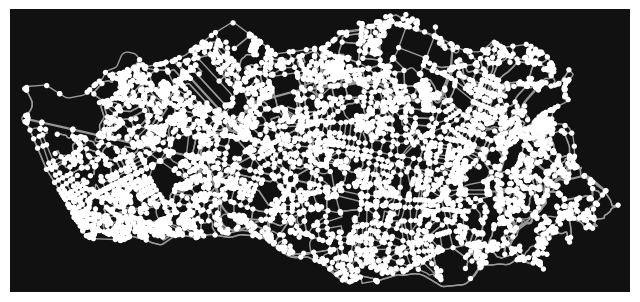

In [1089]:
graph = ox.graph_from_place("Porto, Portugal", network_type='drive')
graph_proj = ox.project_graph(graph, to_crs='EPSG:5018')
fig, ax = ox.plot_graph(graph_proj)

<font color='#425451'>Export in Geopandas </font> 

In [1090]:
nodes_proj, roads_proj = ox.graph_to_gdfs(graph_proj, nodes=True, edges=True)

<font color='#425451'>Find the road corresponding at the starting and ending point  </font> 

In [1091]:
df = df.merge(gpd.sjoin_nearest(df[['TRIP_ID','FROM_LOCATION']].set_geometry('FROM_LOCATION',  crs='EPSG:5018'),
                                roads_proj.reset_index(), 
                                how='left', 
                                max_distance=150, 
                                distance_col='DISTANCE_FROM_ROAD') \
                 .drop_duplicates(subset=['TRIP_ID'])[['TRIP_ID','v','highway','lanes']],
              on='TRIP_ID', how='left', suffixes=('', '_FROM_ROAD')) \
       .rename(columns={'v':'FROM_V','highway':'FROM_ROADTYPE','lanes':'FROM_LANES'})

df = df.merge(gpd.sjoin_nearest(df[['TRIP_ID','TO_LOCATION']].set_geometry('TO_LOCATION',  crs='EPSG:5018'),
                                roads_proj.reset_index(), 
                                how='left', 
                                max_distance=150, 
                                distance_col='DISTANCE_TO_ROAD') \
                 .drop_duplicates(subset=['TRIP_ID'])[['TRIP_ID','u','highway','lanes']],
              on='TRIP_ID', how='left', suffixes=('', '_TO_ROAD')) \
       .rename(columns={'u':'TO_U','highway':'TO_ROADTYPE','lanes':'TO_LANES'})

<font color='#425451'>Discard trips that are not correspond to actual road </font> 

In [1092]:
indices_to_drop = df[(df['FROM_V'].isna()) | (df['TO_U'].isna())].index
df.drop(indices_to_drop, axis=0, inplace=True)
print('{} records dropped, due to not corresponding to actual road.'.format(len(indices_to_drop)))

302 records dropped, due to not corresponding to actual road.


<font color='#425451'>Calculate distance, using graph's network shortest path </font> 

In [1093]:
def shortest_path(graph_proj, source, target, weight):
    
    try: 
        return nx.shortest_path(graph_proj, source, target, weight)
    except: 
        return pd.NA

In [1096]:
df['MAP_ROUTE'] = df.apply(lambda x: shortest_path(graph_proj, x['FROM_V'], x['TO_U'], 'length'), axis=1)

In [1093]:
def shortest_path_length(graph_proj, source, target, weight):
    
    try: 
        return nx.shortest_path_length(graph_proj, source, target, weight)
    except: 
        return pd.NA

In [1094]:
df['MAP_ROUTE_LENGTH'] = df.apply(lambda x: shortest_path_length(graph_proj, x['FROM_V'], x['TO_U'], 'length'), axis=1)

In [1246]:
df['MAP_ROUTE_LENGTH'] = df.apply(lambda x: x['MAP_ROUTE_LENGTH'] if x['MAP_ROUTE_LENGTH']>0 else x['TRAJ_LINE_LENGTH'], axis=1)

<font color='#425451'>Discard trips that osmnx not found a path</font> 

In [1095]:
indices_to_drop =  df[df['MAP_ROUTE_LENGTH'].isna()].index
df.drop(indices_to_drop, axis=0, inplace=True)
print('{} records dropped, due to lack of connectivity between start and end road'.format(len(indices_to_drop)))

406 records dropped, due to lack of connectivity between start and end road


#### <font color='#425451'>Calculate percentage of road types for each route</font> 

In [1231]:
routes = df[['TRIP_ID','MAP_ROUTE']].explode('MAP_ROUTE').rename(columns={'MAP_ROUTE':'v'}).reset_index(drop=True)
routes['u'] = routes.groupby('TRIP_ID', group_keys=False)['v'].apply(lambda x: x.shift(1))
routes.dropna(inplace=True)

In [1232]:
routes = routes.merge(roads_proj.reset_index(), on=['u','v'], how='left') \
               .drop_duplicates(subset=['TRIP_ID','u','v'])[['TRIP_ID','highway','length']]
routes['highway'] = routes['highway'].astype('str')

In [1233]:
routes = routes.groupby(['TRIP_ID','highway'])['length'].sum()

In [1234]:
routes = routes.reset_index()
routes = routes.pivot(index='TRIP_ID', columns='highway', values='length')
routes = routes.reset_index()

In [1235]:
routes = routes.fillna(0)

In [1236]:
routes['residential'] = routes['residential'] + routes["['residential', 'tertiary']"]  + routes["['residential', 'living_street']"]

In [1237]:
routes['highway'] = routes['motorway'] + routes['motorway_link'] + routes['trunk'] + routes['trunk_link'] \
                    + routes['primary'] + routes['primary_link'] + routes['secondary'] + routes['secondary_link'] \
                    + routes['[\'secondary\', \'secondary_link\']']  + routes['[\'motorway_link\', \'secondary\']']

In [1238]:
routes = routes[['TRIP_ID','highway','residential','living_street']]

In [1241]:
df = df.merge(routes, on='TRIP_ID', how='left')

In [1247]:
df['HIGHWAY'] = df['highway']/df['MAP_ROUTE_LENGTH']
df['RESIDENTIAL'] = df['residential']/df['MAP_ROUTE_LENGTH']
df['LIVING_STREET'] = df['living_street']/df['MAP_ROUTE_LENGTH']

#### <font color='#425451'>Calculate number of turns for each route</font> 

In [1257]:
df['ROUTE_TURNS'] = df['MAP_ROUTE'].str.len()-1

#### <font color='#425451'>Export preprocessed data</font> 

In [1262]:
df[['TRIP_ID','CALL_TYPE','ORIGIN_CALL','ORIGIN_STAND',
    'TAXI_ID','DAY_TYPE','TRAVEL_DURATION','FROM_DATE',
    'TO_DATE','HOUR','DAY_OF_WEEK','MONTH','FROM_ROADTYPE',
    'FROM_LANES','TO_ROADTYPE','TO_LANES','MAP_ROUTE_LENGTH',
    'HIGHWAY','RESIDENTIAL','LIVING_STREET','ROUTE_TURNS']].to_pickle('preprocessed_data.pkl')